In [95]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation
from IPython.display import HTML
import time

In [96]:
Fmax = 9.2*100
k = 300#*100
e = 0

In [97]:
F = np.linspace(0,Fmax,10)

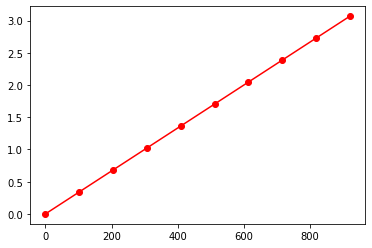

In [98]:
plt.plot(F,(F/k), marker='o', ls='-', c='r')

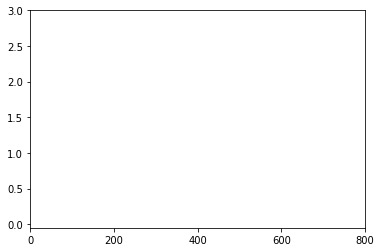

In [99]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = ax.plot([], [], 'ro')

def init():
    ax.set_xticks(np.arange(0,901,200))
    ax.set_yticks(np.arange(0,3.1,0.5))
    #ax.spines['left'].set_bounds(0,0.030)
    #ax.set_aspect("equal", "box")
    #pass
    return ln,

def update(frame):
    #print(frame/k)
    xdata = frame
    ydata = frame/k
    ln.set_data(frame, (frame/k))
    return ln,

ani = matplotlib.animation.FuncAnimation(fig, update, frames=np.linspace(0,Fmax,10),
                    init_func=init, blit=True)
HTML(ani.to_jshtml())

In [100]:
def spring(start, end, nodes, width):
    # https://nrsyed.com/2018/10/07/a-function-for-plotting-a-2d-spring/
    """!
    Return a list of points corresponding to a spring.
    @param r1 (array-like) The (x, y) coordinates of the first endpoint.
    @param r2 (array-like) The (x, y) coordinates of the second endpoint.
    @param nodes (int) The number of spring "nodes" or coils.
    @param width (int or float) The diameter of the spring.
    @return An array of x coordinates and an array of y coordinates.
    """

    # Check that nodes is at least 1.
    nodes = max(int(nodes), 1)

    # Convert to numpy array to account for inputs of different types/shapes.
    start, end = np.array(start).reshape((2,)), np.array(end).reshape((2,))

    # If both points are coincident, return the x and y coords of one of them.
    if (start == end).all():
        return start[0], start[1]

    # Calculate length of spring (distance between endpoints).
    length = np.linalg.norm(np.subtract(end, start))

    # Calculate unit vectors tangent (u_t) and normal (u_t) to spring.
    u_t = np.subtract(end, start) / length
    u_n = np.array([[0, -1], [1, 0]]).dot(u_t)

    # Initialize array of x (row 0) and y (row 1) coords of the nodes+2 points.
    spring_coords = np.zeros((2, nodes + 2))
    spring_coords[:,0], spring_coords[:,-1] = start, end

    # Check that length is not greater than the total length the spring
    # can extend (otherwise, math domain error will result), and compute the
    # normal distance from the centerline of the spring.
    normal_dist = np.sqrt(max(0, width**2 - (length**2 / nodes**2))) / 2

    # Compute the coordinates of each point (each node).
    for i in range(1, nodes + 1):
        spring_coords[:,i] = (
            start
            + ((length * (2 * i - 1) * u_t) / (2 * nodes))
            + (normal_dist * (-1)**i * u_n))

    return spring_coords[0,:], spring_coords[1,:]


In [101]:
xy = np.array([[5,0],[5,1],[5,2],[5,3],[5,4],[5,5]])
len(xy)

6

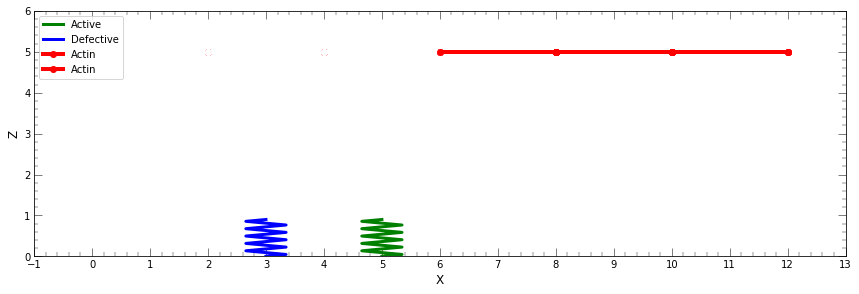

In [124]:
fig, ax = plt.subplots(figsize=(12,4))
fig.tight_layout()
xdata, ydata = [], []
xdata2, ydata2 = [], []
ln, = ax.plot([], [], c="green", lw=3, label='Active')
ln2, = ax.plot([],[], c='blue', lw=3, label='Defective')

# Set up formatting for the movie files
Writer = matplotlib.animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

def init():
    ax.set_xticks(np.arange(-1,14,1))
    ax.set_yticks(np.arange(0,7,1))
    #ax.set_aspect("equal", "box")
    ax.minorticks_on()
    ax.tick_params('both',direction='in',top=True,right=True,length=8, width=0.5,which='major')
    ax.tick_params('both',direction='in',top=True,right=True,length=4, width=0.4,which='minor')
    ax.set_xlabel('X', fontsize=12); ax.set_ylabel('Z', fontsize=12)
    #ax.spines['bottom'].set_position(('axes',-0.03))
    #ax.spines['left'].set_position(('axes',-0.03))
    return ln,

def update(frame):
    xdata = np.array([5, 0]); xdata2 = np.array([3, 0])
    if frame==0:
        ax.plot([0,2,4,6],[5,5,5,5], c='r', lw=4, marker='o', label='Actin')
        ax.legend(loc='upper left')
    if frame<5.0:
        ydata = np.array([5, frame]); ydata2 = np.array([3, frame])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ln2.set_data(*spring(xdata2, ydata2,10,0.7))
        #ax.plot([2,4,6],[5,5,5], c='r', lw=3, marker='o')
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
        
    if frame==6.0: #6
        ydata = np.array([7, frame-1]); ydata2 = np.array([5, frame-1])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ln2.set_data(*spring(xdata2, ydata2,10,0.7))
        ax.plot([0,2],[5,5], c='white', lw=4, marker='o')
        ax.plot([2,4,6,8],[5,5,5,5], c='r', lw=4, marker='o')
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    if frame>6.9 and frame<12:
        #print(frame-7)
        ydata = np.array([5, frame-7])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    if frame==13.0:
        ydata = np.array([7, frame-8]); ydata2 = np.array([7, frame-8])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ln2.set_data(*spring(xdata2, ydata2,10,0.7))
        ax.plot([2,4],[5,5], c='white', lw=4, marker='o')
        ax.plot([4,6,8,10],[5,5,5,5], c='r', lw=4, marker='o')
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    if frame>14 and frame<19:
        ydata = np.array([5, frame-14])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    if frame==20.0:
        ydata = np.array([7, frame-15]); ydata2 = np.array([3, frame-19])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ln2.set_data(*spring(xdata2, ydata2,10,0.7))
        ax.plot([4,6],[5,5], c='white', lw=4, marker='o')
        ax.plot([6,8,10,12],[5,5,5,5], c='r', lw=4, marker='o')
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    if frame>21 and frame<25:
        ydata = np.array([5, frame-24]); ydata2 = np.array([3, frame-24])
        ln.set_data(*spring(xdata, ydata,10,0.7))
        ln2.set_data(*spring(xdata2, ydata2,10,0.7))
        ax.set_xticks(np.arange(-1,14,1))
        ax.set_yticks(np.arange(0,7,1))
    return ln,

ani = matplotlib.animation.FuncAnimation(fig, update, frames=np.round(np.arange(0,25,0.06),1),interval=80, save_count = 50,init_func=init, blit=True)
##ani.save('im.mp4', writer=writer)
##ani.save('particle_box.mp4', fps=30, extra_args=['-vcodec', 'libx264']) # fps = 30

writermp4 = matplotlib.animation.FFMpegWriter(fps=60) 
ani.save('act_def_ani.mp4', writer=writermp4)

HTML(ani.to_jshtml())

In [106]:
np.round(np.arange(0,20,0.06),1)

array([ 0. ,  0.1,  0.1,  0.2,  0.2,  0.3,  0.4,  0.4,  0.5,  0.5,  0.6,
        0.7,  0.7,  0.8,  0.8,  0.9,  1. ,  1. ,  1.1,  1.1,  1.2,  1.3,
        1.3,  1.4,  1.4,  1.5,  1.6,  1.6,  1.7,  1.7,  1.8,  1.9,  1.9,
        2. ,  2. ,  2.1,  2.2,  2.2,  2.3,  2.3,  2.4,  2.5,  2.5,  2.6,
        2.6,  2.7,  2.8,  2.8,  2.9,  2.9,  3. ,  3.1,  3.1,  3.2,  3.2,
        3.3,  3.4,  3.4,  3.5,  3.5,  3.6,  3.7,  3.7,  3.8,  3.8,  3.9,
        4. ,  4. ,  4.1,  4.1,  4.2,  4.3,  4.3,  4.4,  4.4,  4.5,  4.6,
        4.6,  4.7,  4.7,  4.8,  4.9,  4.9,  5. ,  5. ,  5.1,  5.2,  5.2,
        5.3,  5.3,  5.4,  5.5,  5.5,  5.6,  5.6,  5.7,  5.8,  5.8,  5.9,
        5.9,  6. ,  6.1,  6.1,  6.2,  6.2,  6.3,  6.4,  6.4,  6.5,  6.5,
        6.6,  6.7,  6.7,  6.8,  6.8,  6.9,  7. ,  7. ,  7.1,  7.1,  7.2,
        7.3,  7.3,  7.4,  7.4,  7.5,  7.6,  7.6,  7.7,  7.7,  7.8,  7.9,
        7.9,  8. ,  8. ,  8.1,  8.2,  8.2,  8.3,  8.3,  8.4,  8.5,  8.5,
        8.6,  8.6,  8.7,  8.8,  8.8,  8.9,  8.9,  9

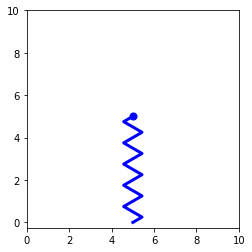

In [65]:
fig, ax = plt.subplots()

xy1 = np.array([5, 0]) # origin
xy2 = np.array([5, 5])
x = np.array([xy1[0],xy2[0]])
y = np.array([xy1[1],xy2[1]])

ax.plot(*spring(xy1,xy2,10,1), c="blue", lw=3)
ax.scatter(xy2[0],xy2[1], c='b', s=50)
ax.set_xticks(np.arange(0,11,2))
ax.set_yticks(np.arange(0,11,2))
ax.set_aspect("equal", "box")

plt.show()

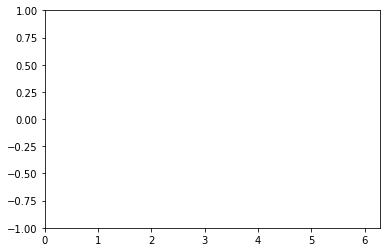

In [33]:


t = np.linspace(0,2*np.pi)
x = np.sin(t)

fig, ax = plt.subplots()
ax.axis([0,2*np.pi,-1,1])
l, = ax.plot([],[])

def animate(i):
    #print(x[:i])
    l.set_data(t[:i], x[:i])

ani = matplotlib.animation.FuncAnimation(fig, animate, frames=len(t))

from IPython.display import HTML
HTML(ani.to_jshtml())

#plt.show()

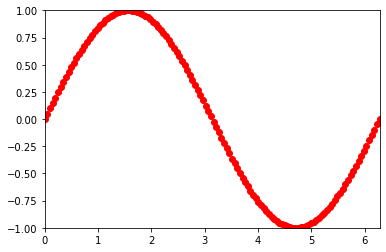

In [13]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = plt.plot([], [], 'ro')

def init():
    ax.set_xlim(0, 2*np.pi)
    ax.set_ylim(-1, 1)
    return ln,

def update(frame):
    xdata.append(frame)
    ydata.append(np.sin(frame))
    ln.set_data(xdata, ydata)
    return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128),
                    init_func=init, blit=True)
HTML(ani.to_jshtml())

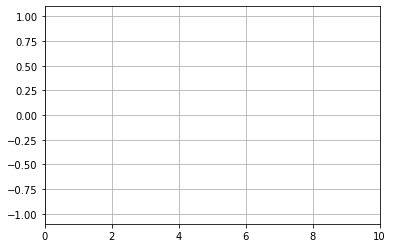

In [10]:



def data_gen():
    for cnt in itertools.count():
        t = cnt / 10
        yield t, np.sin(2*np.pi*t) * np.exp(-t/10.)


def init():
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlim(0, 10)
    del xdata[:]
    del ydata[:]
    line.set_data(xdata, ydata)
    return line,

fig, ax = plt.subplots()
line, = ax.plot([], [], lw=2)
ax.grid()
xdata, ydata = [], []


def run(data):
    # update the data
    t, y = data
    xdata.append(t)
    ydata.append(y)
    xmin, xmax = ax.get_xlim()

    if t >= xmax:
        ax.set_xlim(xmin, 2*xmax)
        ax.figure.canvas.draw()
    line.set_data(xdata, ydata)

    return line,

ani = animation.FuncAnimation(fig, run, data_gen, interval=10, init_func=init)
from IPython.display import HTML
HTML(ani.to_jshtml())